# Class.info
Index: 3200 entries, 0 to 5573
Data columns (total 2 columns):

|#|Column|Non-Null Count|Dtype|
|---|------|--------------|-----|
|0  | Document | 3200 non-null |  object|
|1  | Class   |  3200 non-null  | object|

dtypes: object(2)
memory usage: 75.0+ KB
None

-------------------------------------------------

# Class

politics          300
business          300
entertainment     300
sport             300
science           200
religion          200
media             200
education         200
crime             200
comedy            200
artsandculture    200
space             100
graphics          100
medical           100
historical        100
technologie       100
food              100

-------------------------------------------------
#df.head

|#|Document|Class|
|---|------|--------------|
|0  | articl 28641 datadec kevin marcu write public ... | space |
|1  | date seri link messag period post usenet group...   |  space  |
|2  | date 01 apr 93 gmt ralph buttigieg write ca go...   |  space  |
|1  | articl dannyb daniel burstein write short stor...   |  space  |
|1  | hi folk exactli certain best place ask search ...  |  space  |
                                              
-------------------------------------------------
# df 결측치 수
Document:    0

Class:       0

dtype: int64

---
- train_input.npy: 정수 인코딩을 진행한 훈련 document(텍스트)데이터
- train_label.npy: 훈련 category(class)데이터
- test_input.npy: 정수 인코딩을 진행한 테스트 document(텍스트)데이터
- test_label.npy: 테스트 category(class)데이터
- clean_data.csv: 전처리만 진행한 [doc,class]데이터셋(정수 인코딩X), train test 분할 안 되어있습니다.

In [1]:
!pip install wordcloud
!pip install tokenization

In [2]:
import pandas
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_text as text
import pandas as pd
from wordcloud import WordCloud
import tokenization
import tensorflow as tf
import tensorflow_hub as hub
from keras.utils import to_categorical
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
import tensorflow_text as text
import nltk
nltk.download('stopwords')
nltk.download('punkt_tab')

from nltk.corpus import stopwords
import nltk

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


In [88]:
#1번 데이터셋 다운로드
import kagglehub

# Download latest version
path1 = kagglehub.dataset_download("jensenbaxter/10dataset-text-document-classification")

print("Path to dataset files:", path1)

Path to dataset files: /kaggle/input/10dataset-text-document-classification


In [89]:
#1번 데이터셋 전처리
stop_words = stopwords.words('english')
prt = nltk.stem.PorterStemmer()
vocab = {}
def preprocess(document):   #전처리 함수

    #word단위로 텍스트를 토큰화한다.(잘라낸다)
    tokens = nltk.word_tokenize(document)

    #특수문자를 제거하고 모든 알파벳을 소문자로 변환한다.
    tokens_pun_lower = [i.lower() for i in tokens if i.isalnum()]

    #의미없는 단어(접속사, 접미사 등)들을 제거한다.
    tokens_stop = [i for i in tokens_pun_lower if i not in stop_words]

    #단어를 어간,어근 형태로 변환한다.(stemming->stem)
    terms = [prt.stem(i) for i in tokens_stop]
    for word in terms:
      if word not in vocab:
        vocab[word]=0
      vocab[word]+=1
    return " ".join(terms)


def readFile(document_path):
    #파일에서 텍스트 데이터를 읽어온다.
    with open(document_path, 'r') as file:
        document = file.read()
    return preprocess(document)

import numpy as np # linear algebra
import pandas as pd # data processing,

import os
Data = []
for dirname, _, filenames in os.walk(path1):
    for filename in filenames:
        doc_class = filename.split('_')[0].lower()
        #데이터를 읽고 전처리를 진행한다.
        documents = readFile(os.path.join(dirname, filename))

        Data.append([documents, doc_class])
df = pd.DataFrame (Data, columns = ['Document', 'Class'])
df.head()


,Document,Class
0,date seri link messag period post usenet group...,space
1,shag rob unverzagt write articl 5apr1993180450...,space
2,anyon know size cold ga roll control thruster ...,space
3,nanderso norman anderson write jmcocker mitch ...,space
4,recent observ taken hubbl space telescop faint...,space


In [90]:
#2번 데이터셋 다운로드
import kagglehub

# Download latest version
path2 = kagglehub.dataset_download("timilsinabimal/newsarticlecategories")

print("Path to dataset files:", path2)

Path to dataset files: /kaggle/input/newsarticlecategories


In [91]:
#2번 데이터셋 전처리
df2 = pd.read_csv(path2 + "/news-article-categories.csv")
category_list = ["ARTS & CULTURE", "BUSINESS", "COMEDY", "CRIME", "EDUCATION", "ENTERTAINMENT", "MEDIA", "POLITICS", "RELIGION", "SCIENCE", "SPORTS"]
df2_filter = df2.groupby('category').head(200)  #각 카테고리 별로 200개의 데이터 추출
df2_filter = df2_filter[df2_filter['category'].isin(category_list)] #사용하지 않는 카테고리의 데이터 삭제(tech,women,education)
#df 데이터프레임으로 열 형식 맞추기
df2_filter = df2_filter[['title','body','category']]
df2_filter.columns = ['Title','Document','Class']
df2_filter.loc[df2_filter['Class'] == 'SPORTS', 'Class'] = 'sport' # Fixed: Correctly modify the 'Class' column using boolean indexing


map_Doc = map(preprocess, df2_filter['Document']) #2번 데이터셋의 텍스트 전처리를 진행한다.
df2_filter['Document'] = list(map_Doc)
df2_filter = df2_filter.drop('Title', axis=1) #사용하지 않는 title열 제거
df2_filter['Class'] = df2_filter['Class'].str.replace(' & ', 'and').str.lower() #df 데이터 프레임으로 class 형식 맞추기
df2_filter.head()


,Document,Class
0,octob 2017 carolyn kramer receiv disturb phone...,artsandculture
1,week talk actor jeff hiller hit broadway play ...,artsandculture
2,new yorker take presid donald trump ask would ...,artsandculture
3,kellen hickey live hudson wisconsin gift give ...,artsandculture
4,someth combin tradit uptight look renaiss peri...,artsandculture


In [92]:
#df와 df2 데이터셋 합치기
integration_df = pd.concat([df, df2_filter])

#데이터셋에 대한 전반적인 정보
print(integration_df.info())
print("-------------------------------------------------")
#class의 각 카테고리 별 데이터의 수
print(integration_df['Class'].value_counts())
print("-------------------------------------------------")
print(integration_df.head())
print("-------------------------------------------------")
#통합df의 결측
print(integration_df.isna().sum())

<class 'pandas.core.frame.DataFrame'>
Index: 3200 entries, 0 to 5573
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Document  3200 non-null   object
 1   Class     3200 non-null   object
dtypes: object(2)
memory usage: 75.0+ KB
None
-------------------------------------------------
Class
politics          300
entertainment     300
sport             300
business          300
religion          200
crime             200
comedy            200
artsandculture    200
education         200
science           200
media             200
space             100
food              100
technologie       100
graphics          100
medical           100
historical        100
Name: count, dtype: int64
-------------------------------------------------
                                            Document  Class
0  date seri link messag period post usenet group...  space
1  shag rob unverzagt write articl 5apr1993180450...  space
2  anyon know s

In [93]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

X = integration_df['Document']
y = integration_df['Class']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# 훈련 데이터셋 정수 인코딩 진행
tokenizer = Tokenizer()
tokenizer.fit_on_texts(X_train)
train_sequences = tokenizer.texts_to_sequences(X_train)

word_vocab = tokenizer.word_index # 단어-정수 인코딩 사전
word_vocab["<PAD>"] = 0

train_length = X_train.apply(len)
MAX_SEQUENCE_LENGTH = int(np.median(train_length))

train_inputs = pad_sequences(train_sequences, maxlen=MAX_SEQUENCE_LENGTH, padding='post') # 정규화(sequence 길이 맞추기)
print('Shape of train data: ', train_inputs.shape)

TRAIN_INPUT_DATA = 'train_input.npy'  # 정수 인코딩을 진행한 훈련document(텍스트)데이터
TRAIN_LABEL_DATA = 'train_label.npy'  # 훈련category(class)데이터
DATA_IN_PATH = '/content/drive/MyDrive/Colab Notebooks/MLdata/'
if not os.path.exists(DATA_IN_PATH):
    os.makedirs(DATA_IN_PATH)
np.save(open(DATA_IN_PATH + TRAIN_INPUT_DATA, 'wb'), train_inputs)
np.save(open(DATA_IN_PATH + TRAIN_LABEL_DATA, 'wb'), y_train)

Shape of train data:  (2560, 1341)


In [94]:
# 테스트 데이터셋 정수 인코딩 진행
test_sequences = tokenizer.texts_to_sequences(X_test)
test_inputs = pad_sequences(test_sequences, maxlen=MAX_SEQUENCE_LENGTH, padding='post')

print('Shape of test data: ', test_inputs.shape)

TEST_INPUT_DATA = 'test_input.npy'  # 정수 인코딩을 진행한 테스트document(텍스트)데이터
TEST_LABEL_DATA = 'test_label.npy'  # 테스트category(class)데이터
CLEAN_DATA = 'clean_data.csv' # 전처리만 진행한 [doc,class]데이터셋(정수 인코딩X)
np.save(open(DATA_IN_PATH + TEST_INPUT_DATA, 'wb'), test_inputs)
np.save(open(DATA_IN_PATH + TEST_LABEL_DATA, 'wb'), y_test)
integration_df.to_csv(DATA_IN_PATH + CLEAN_DATA, index = False)

Shape of test data:  (640, 1341)


In [96]:
# 데이터셋에 대한 EDA제작

db = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/MLdata/clean_data.csv')
print(db.head())
print(db['Class'].value_counts())


                                            Document  Class
0  date seri link messag period post usenet group...  space
1  shag rob unverzagt write articl 5apr1993180450...  space
2  anyon know size cold ga roll control thruster ...  space
3  nanderso norman anderson write jmcocker mitch ...  space
4  recent observ taken hubbl space telescop faint...  space
Class
politics          300
entertainment     300
sport             300
business          300
religion          200
crime             200
comedy            200
artsandculture    200
education         200
science           200
media             200
space             100
food              100
technologie       100
graphics          100
medical           100
historical        100
Name: count, dtype: int64


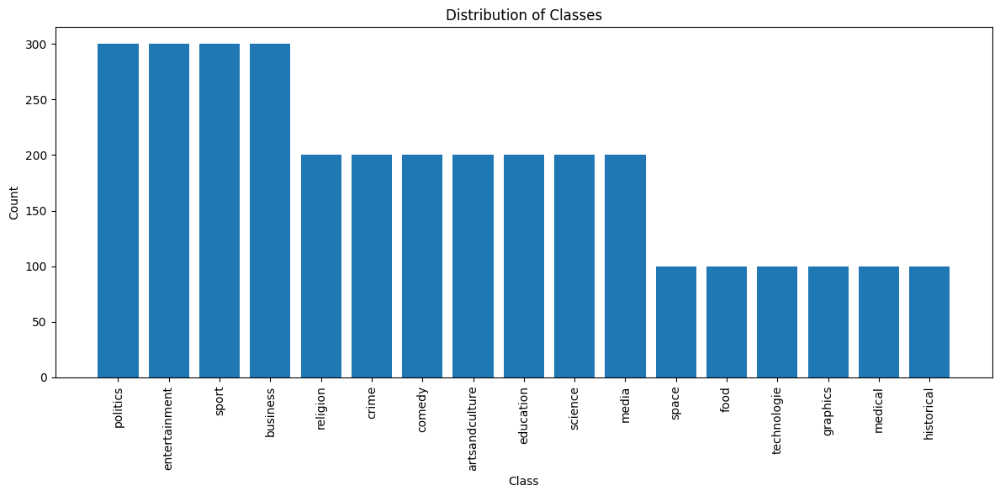

In [97]:
# 카테고리 별 데이터의 개수
class_counts = db['Class'].value_counts()
class_labels = class_counts.index
class_values = class_counts.values

plt.figure(figsize=(12, 6)) # Optional: adjust figure size for better readability
plt.bar(
    x = class_labels,  # Use class labels for the x-axis
    height = class_values  # Use class counts for the height of the bars
)

plt.xticks(rotation=90) # Optional: Rotate labels if they overlap
plt.xlabel("Class")     # Add an x-axis label
plt.ylabel("Count")     # Add a y-axis label
plt.title("Distribution of Classes") # Add a title
plt.tight_layout()      # Adjust layout to prevent labels overlapping
plt.show()

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.11/dist-packages/matplotlib/pyplot.py'>

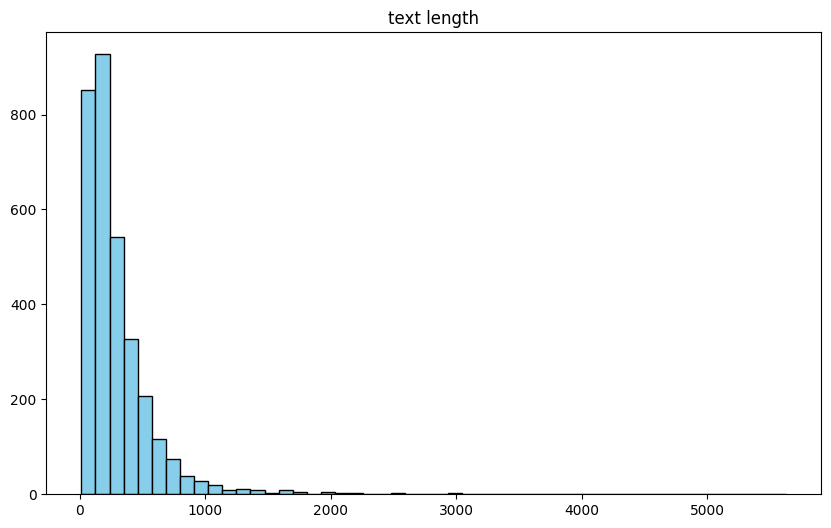

In [98]:
word_count_list = []
for i in range(len(db)):
  document_text = db['Document'][i]
  words = document_text.split(' ')
  word_count_list.append(len(words))

plt.figure(figsize=(10, 6))
plt.hist(word_count_list, bins=50, color='skyblue', edgecolor='black')
plt.title("text length") # Add a title
plt

In [99]:
print(vocab)

{'date': 332, 'seri': 440, 'link': 219, 'messag': 455, 'period': 377, 'post': 1031, 'usenet': 17, 'group': 1109, 'attempt': 427, 'provid': 873, 'good': 1074, 'answer': 384, 'frequent': 129, 'ask': 1153, 'question': 985, 'refer': 373, 'materi': 276, 'worth': 181, 'preserv': 71, 'correct': 196, 'would': 3708, 'like': 3627, 'includ': 1776, 'send': 353, 'email': 520, 'leech': 5, 'jon': 34, 'want': 1820, 'see': 1468, 'faq': 45, 'add': 291, 'kill': 613, 'file': 489, 'read': 783, 'newsread': 1, 'articl': 546, 'subject': 292, 'luck': 36, 'volum': 146, 'excess': 46, 'right': 1546, 'hope': 767, 'trim': 10, 'rewrit': 15, 'condens': 14, 'time': 3598, 'avail': 451, 'ame': 29, 'space': 847, 'archiv': 94, 'summari': 46, 'accept': 311, 'place': 1041, 'given': 475, 'point': 1049, 'circul': 45, 'exist': 325, 'inform': 941, 'avoid': 207, 'rehash': 4, 'old': 424, 'better': 632, 'build': 574, 'top': 489, 'start': 1004, 'noth': 390, 'depress': 74, 'topic': 104, '100th': 5, 'give': 850, 'complet': 426, 'shor

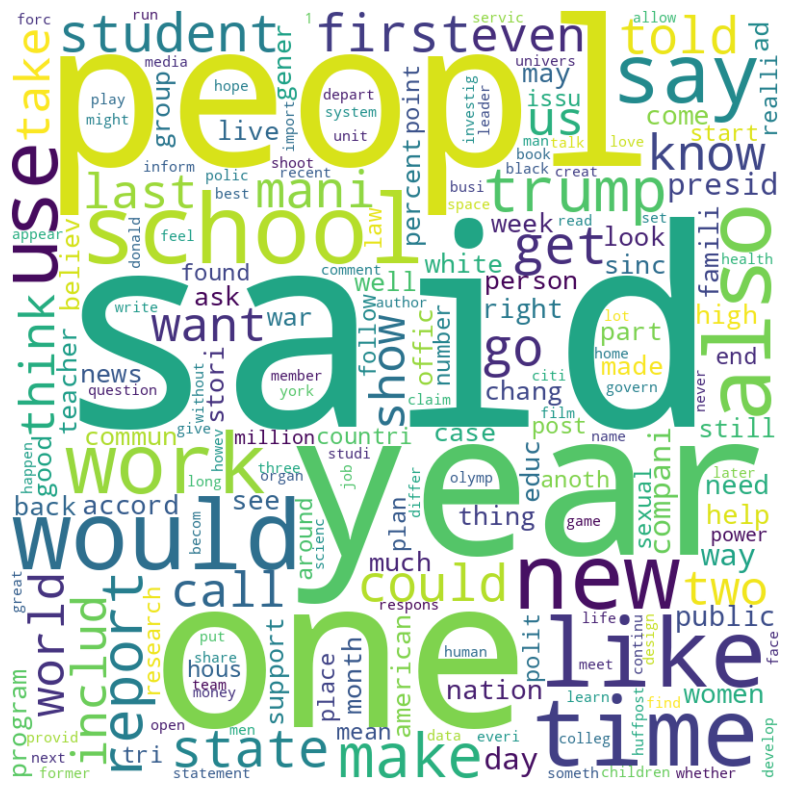

In [100]:
# 전체 문서에 대한 word cloud
wc = WordCloud(
    background_color='white',
    width=800,
    height=800
)
wc_img = wc.generate_from_frequencies(vocab)
plt.figure(figsize=(10, 10))
plt.imshow(wc_img, interpolation='bilinear')
plt.axis('off')
plt.show()

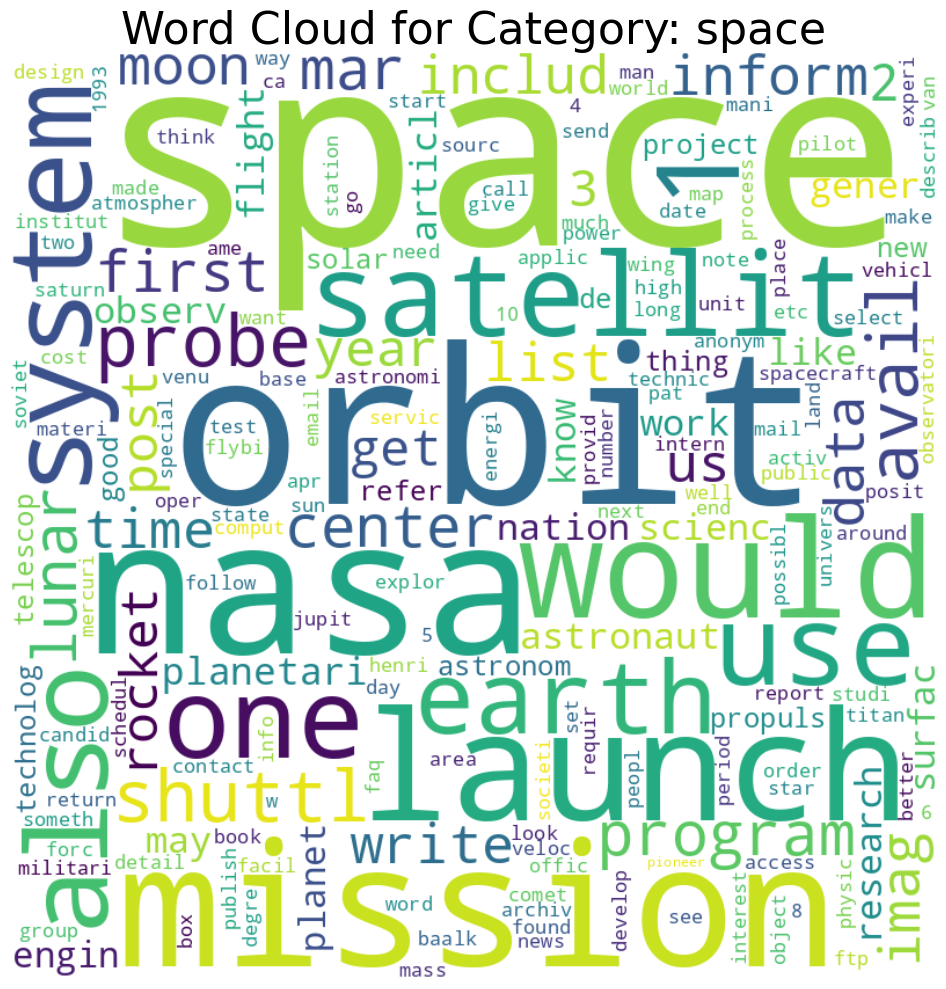

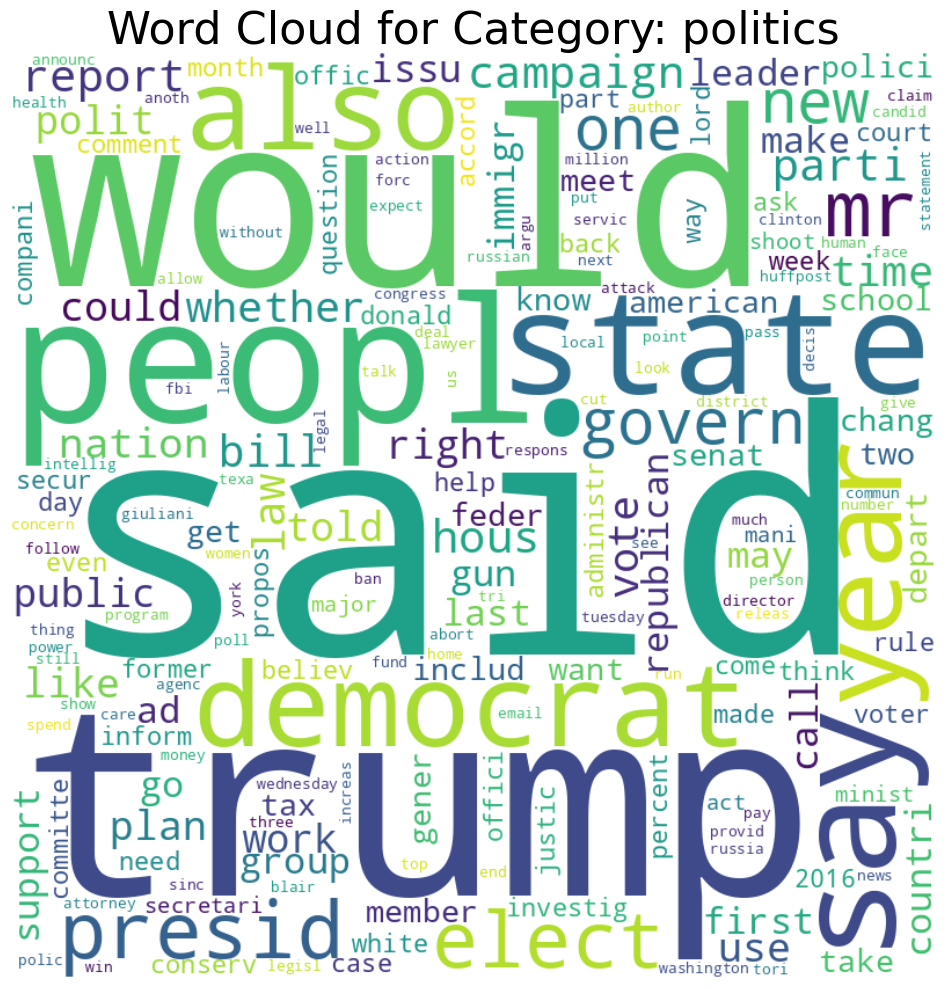

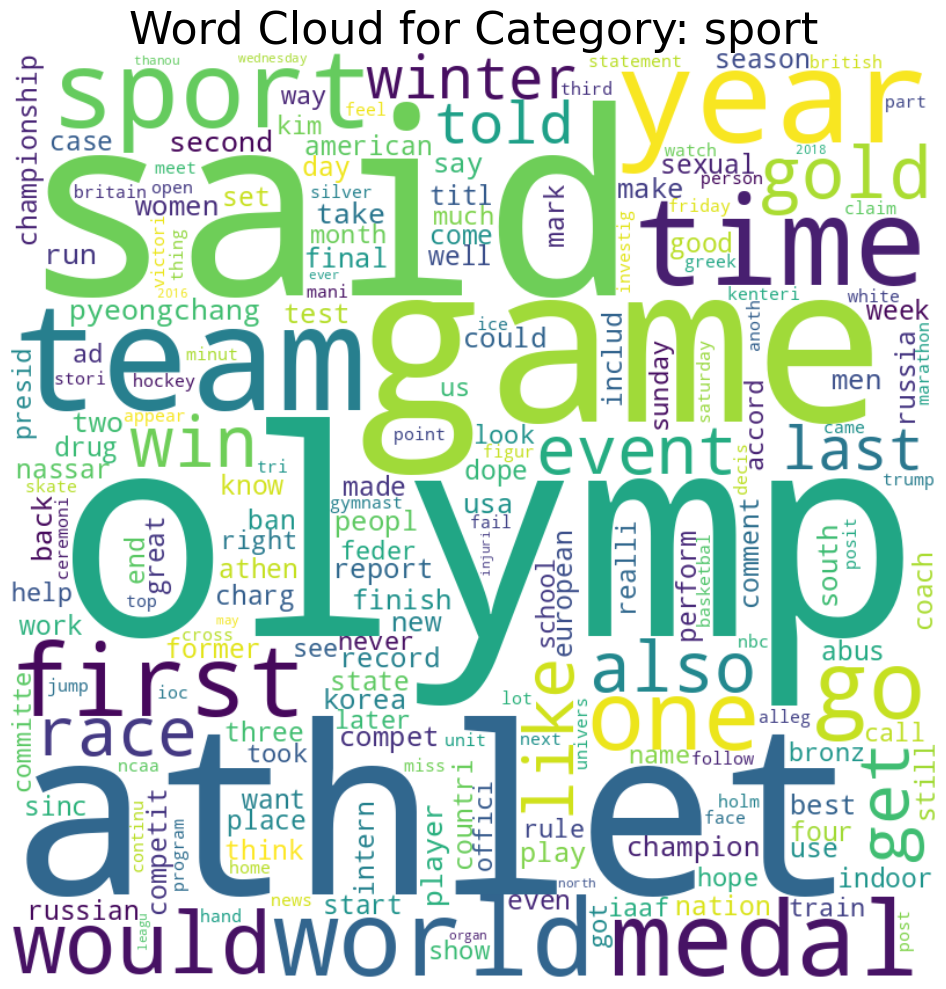

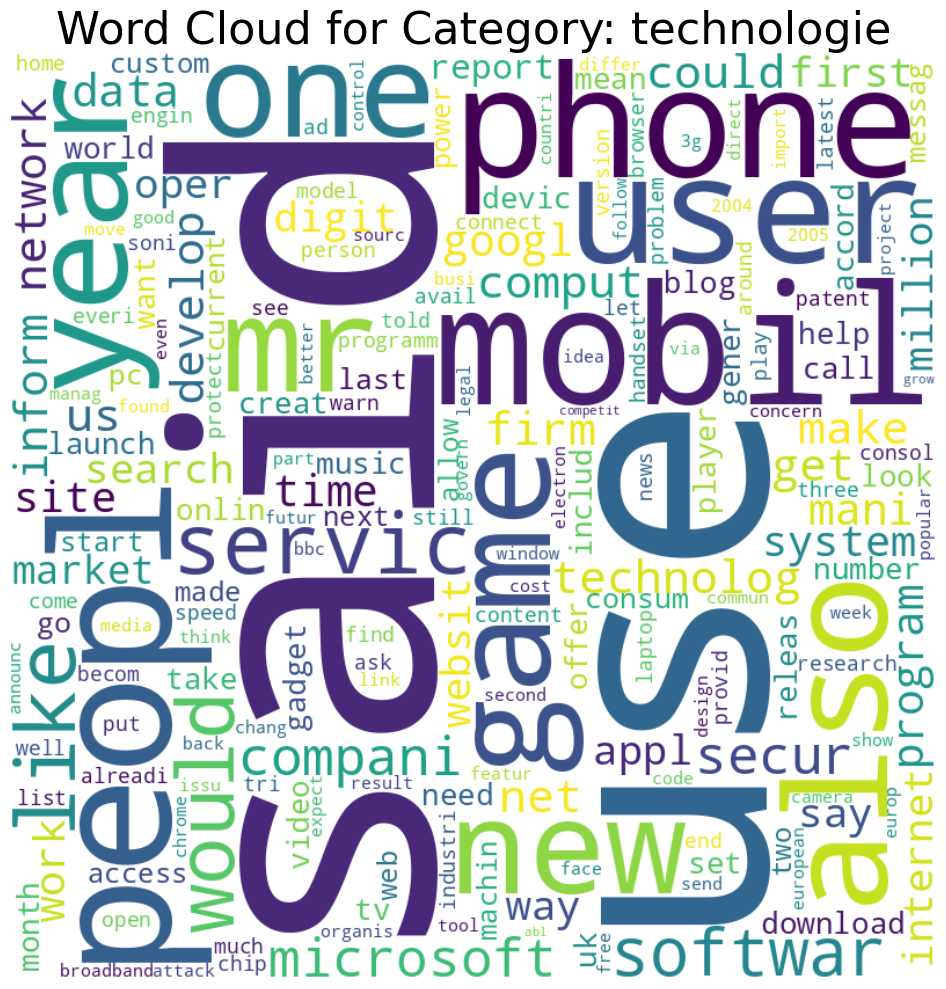

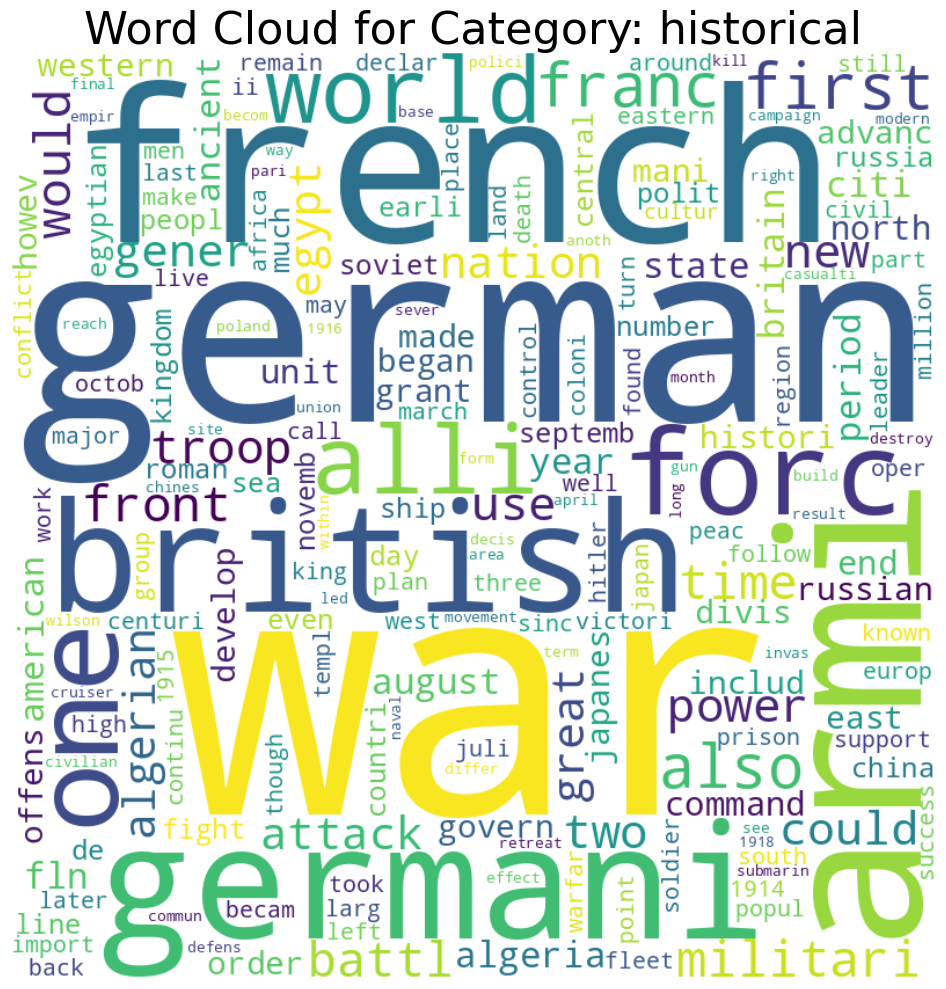

...

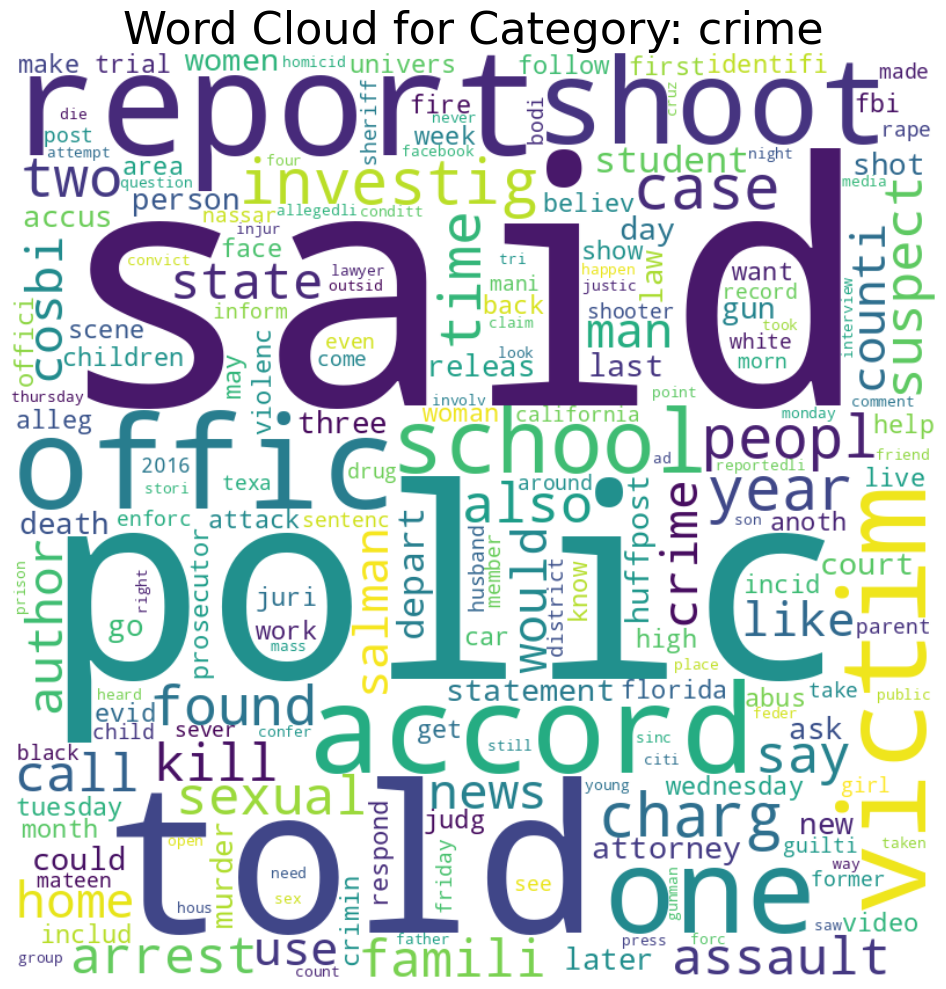

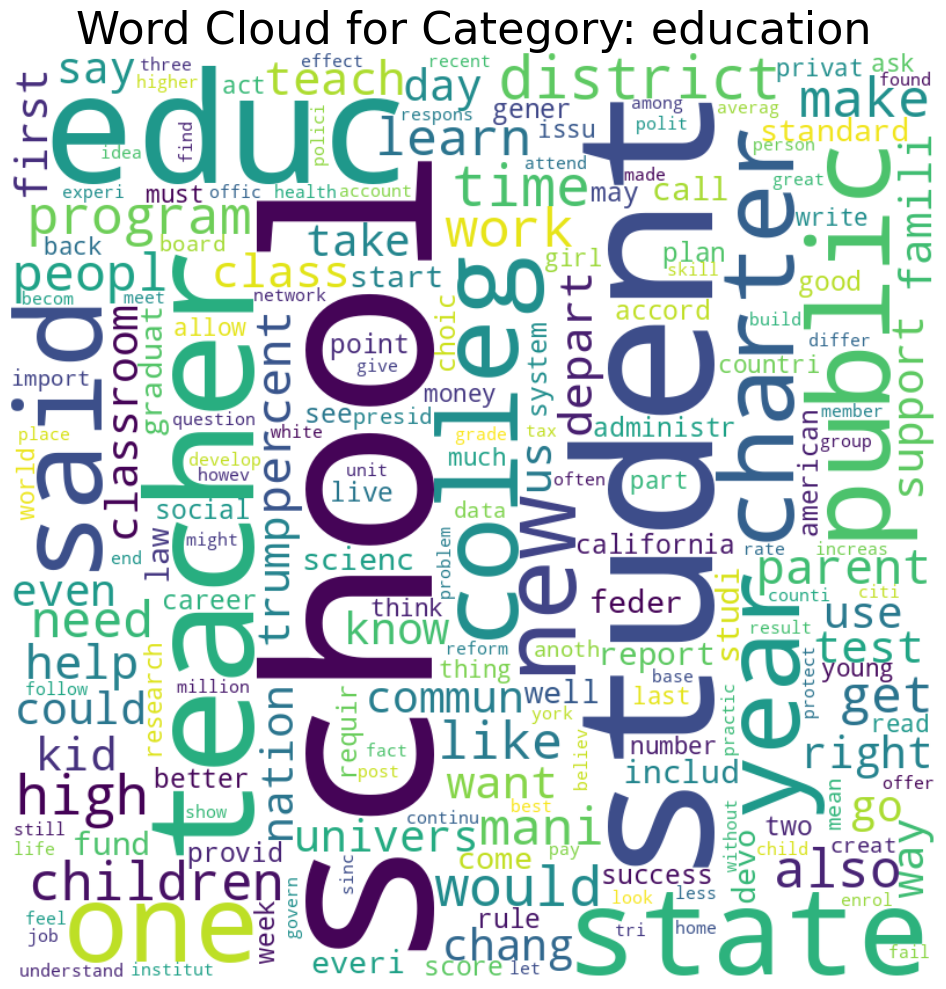

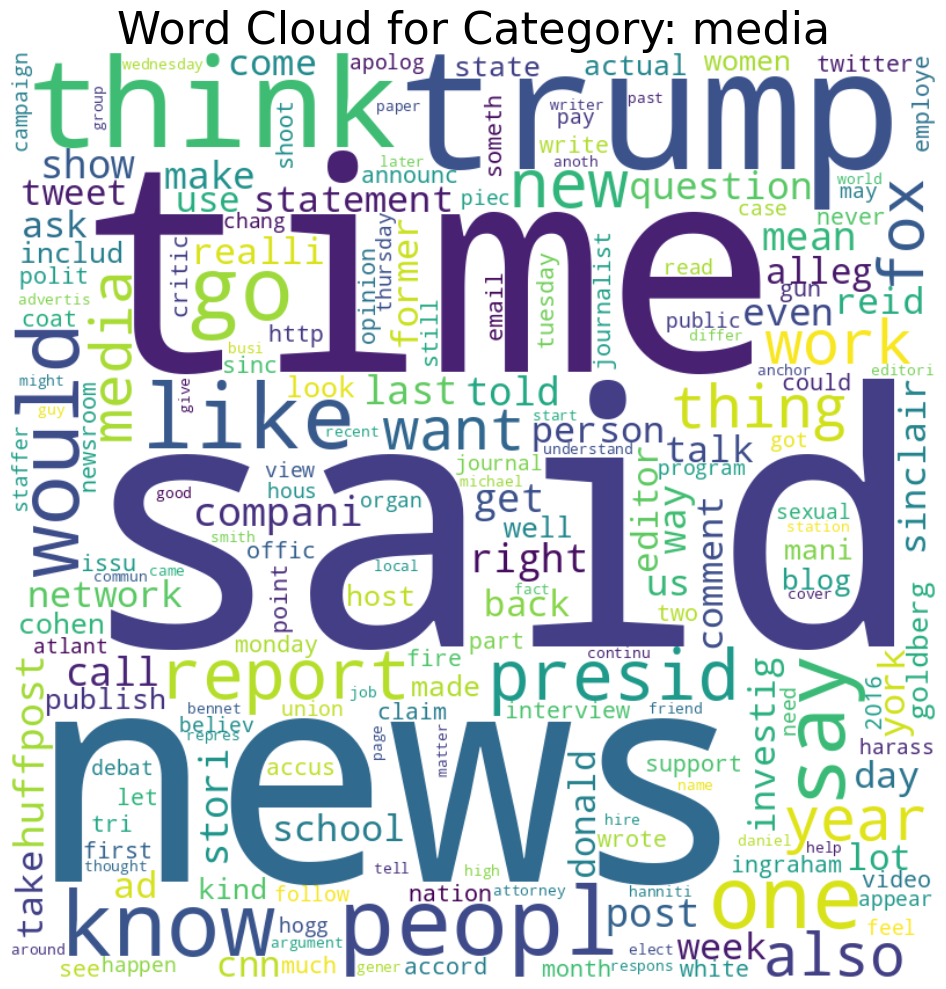

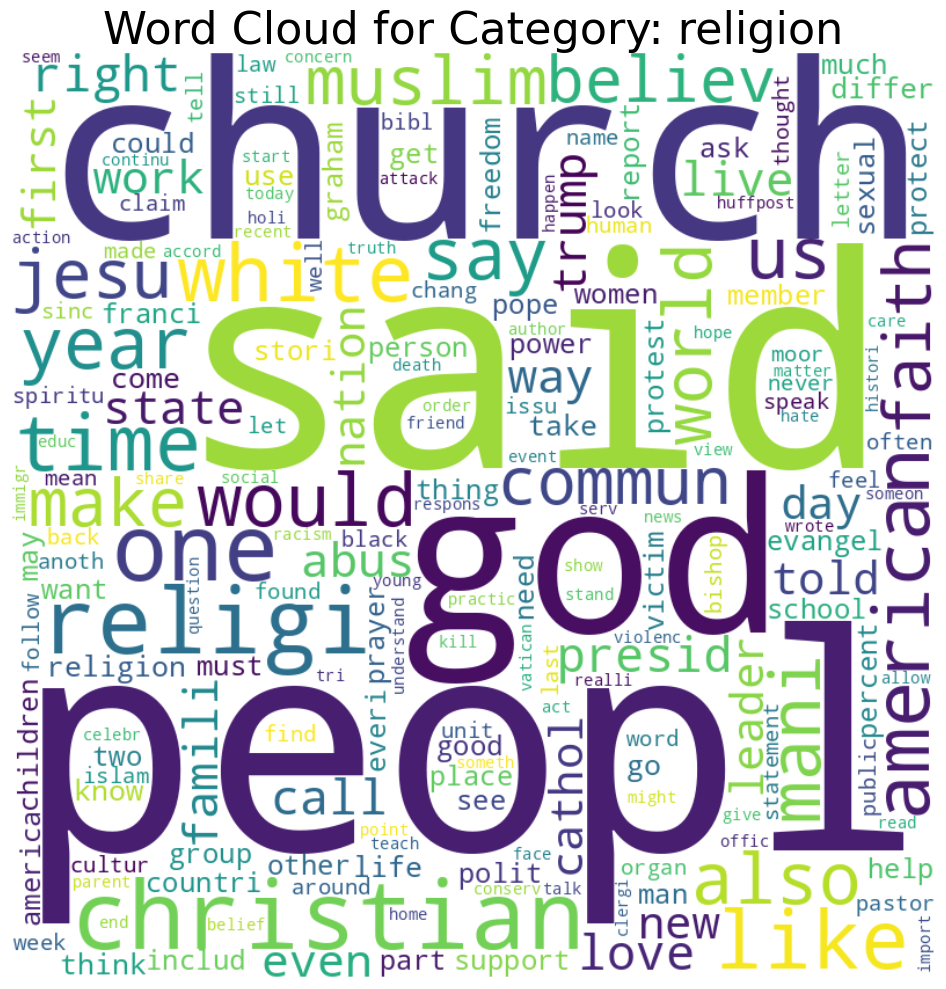

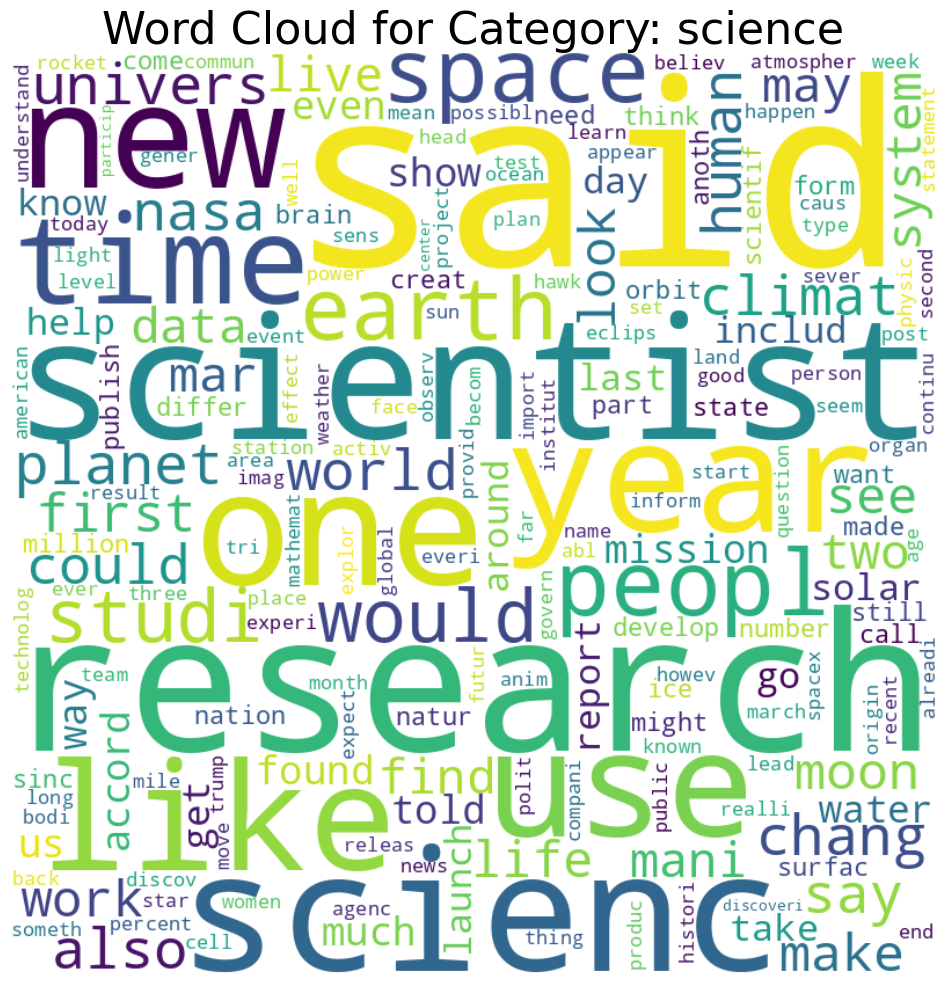

In [101]:
# 카테고리 별 문서에 대한 word clouds

for category in db['Class'].unique():
  category_vocab = {}
  for docu in db[db['Class'] == category]['Document']:
    tokens = nltk.word_tokenize(docu)
    for word in tokens:
      if word not in category_vocab:
        category_vocab[word]=0
      category_vocab[word]+=1
  wc = WordCloud(
    background_color='white',
    width=800,
    height=800
  )
  wc_img = wc.generate_from_frequencies(category_vocab)
  plt.figure(figsize=(10, 10))
  plt.imshow(wc_img, interpolation='bilinear')
  plt.axis('off')
  plt.title(f'Word Cloud for Category: {category}', fontsize=32)
  plt.tight_layout()
  plt.savefig(f'{category}.png')
  plt.show()
